In [19]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [61]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import regularizers
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.preprocessing import image
import numpy as np
import os
import datetime
%matplotlib inline


In [23]:
image_paths = "/content/drive/MyDrive/tree_dataset/train" #imagepaths diye değişken oluşturp datasetin train klasörünün yolunu verdik


In [24]:
test_path="/content/drive/MyDrive/tree_dataset/test" #testpath diye değişken oluşturup datasetin test klasörünün yolunu verdik


In [29]:
batch_size=32
img_height = 255
img_width = 255

In [30]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory( #bu fonksiyon ile trai dataset üzerinden direkt okuma yaparak görüntü dosyalarından bir tf.data.Dataset oluşturur
  image_paths,
  validation_split=0.2,
  subset="training", #ya training ya da validation değerini alır alt kümenin ne olduğunu gösterir.validation_split değişkeni olduğu için kullanmak zorunlu
  seed=123, #random sayı üretir none demediği için başlangıç değerinden başlayarak sayı üretir
  image_size=(img_height, img_width), #255x255
  batch_size=batch_size) #her seferinde 255x255 boyutunda 32 tane görüntüyü geri döndürür


Found 1584 files belonging to 5 classes.
Using 1268 files for training.


In [31]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  image_paths,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)


Found 1584 files belonging to 5 classes.
Using 316 files for validation.


In [32]:
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
  test_path,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 411 files belonging to 5 classes.


In [8]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 255, 255, 3)
(32,)


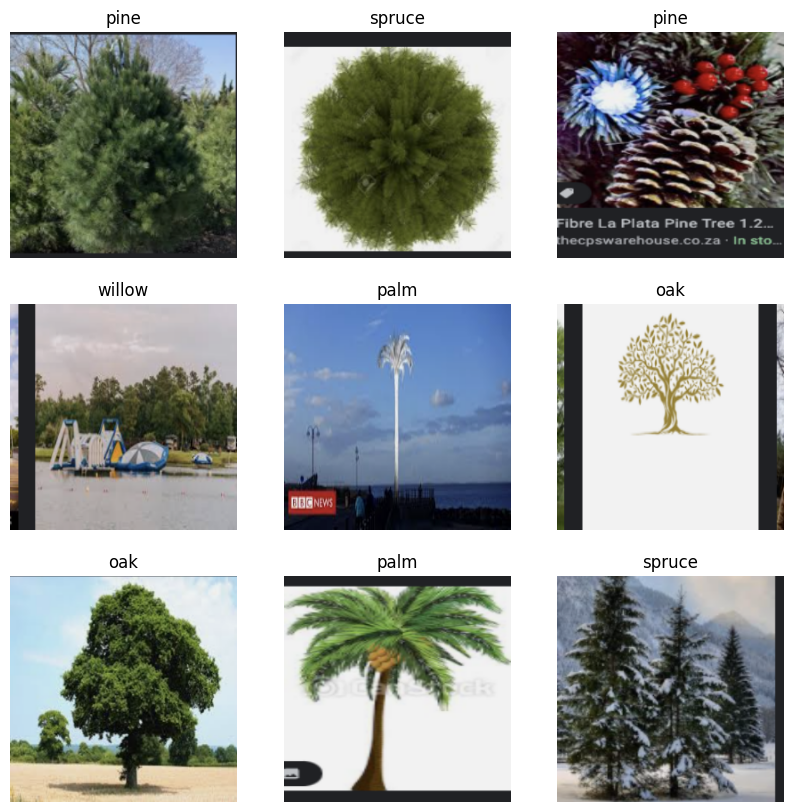

In [37]:
class_names = train_ds.class_names #sınıf adlarını alır
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1): #eğitim kümesinden 1 örnek alır parantez içinde 1 dediği için ve onları images,label değişkenlerine ayırır
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8")) #seçilen örnek görüntüyü(numpy dizisinini) görselleştirir
    plt.title(class_names[labels[i]]) #görüntünün başlığını labelı kullanarak sınıf adıyla belirtir.
    plt.axis("off") #eksen sınıflarını ve etiketleri gizler


In [44]:
from keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout
from tensorflow.keras import Model


In [38]:
base_model = tf.keras.applications.resnet50.ResNet50(weights='imagenet', include_top=False) #imagenet veri kümesinden eğitilmiş ağırlıkları yükler ve sınıflandırma katmanını çıkarttık

x = base_model.output #çıkış katmanı eklendi
x = GlobalAveragePooling2D()(x) #
x = Dense(1024, activation='relu')(x)
predictions = Dense(5, activation='softmax')(x) #sınıflandırma katmanı

model = Model(inputs=base_model.input, outputs=predictions) # modelin girişine resnet50nin girişini çıkışınada kendi oluşturduğumuz çıkışı verdik ve bu model değişkenini kullanark eğitim yapıcaz

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy']) #modeli derledik

In [39]:
def get_early_stopping(): #overfitingi önlemek için model belli bir noktada eğer doğrulama lossu belli bi miktar altına düşmüyorsa erken durdurma işlmei yapar

    return tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)



In [41]:
def get_checkpoint_best_only(): #en iyi model ağırlıklarını kaydetmek için kullanılır

    checkpoint_best_path= 'checkpoints_best_only' #kaydedilecek best model weihgtinin dosya adı
    checkpoint_best= ModelCheckpoint(filepath=checkpoint_best_path, #kaydedilecek best model weihgtinin dosya yolu
                           frequency='epoch', #ağırlıkların ne sıklıkla kaydedileceğini belirtmek için kullanılır. he repoch sonunda kaydetmesini istedik
                           save_weights_only=False, #false olduğu için modelin mimarisini ağırlıklarını kaydeder
                           monitor='val_accuracy', #val_accuracy değerini izleyip en iyi model ağırlıklarını kaydedecek
                           save_best_only=True,
                           verbose=1)
    return checkpoint_best

In [45]:
checkpoint_best_only = get_checkpoint_best_only()
early_stopping = get_early_stopping()
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") #log dosyalarının saklanacağı dizin ve adı belirlenir
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

#callbacks = [checkpoint_best_only, early_stopping, tensorboard_callback]
callbacks = [checkpoint_best_only, tensorboard_callback]


In [46]:
history = model.fit(train_ds, validation_data=val_ds, epochs=30,callbacks=callbacks) #30 epoch boyutunda callbackleri kullnarak train_ds ve validation_ds  verileirini kullanarak eğitim yapar


Epoch 1/30
40/40 [==============================] - ETA: 0s - loss: 1.6548 - accuracy: 0.4661
Epoch 1: val_accuracy improved from -inf to 0.19304, saving model to checkpoints_best_only


40/40 [==============================] - 113s 2s/step - loss: 1.6548 - accuracy: 0.4661 - val_loss: 2371.9463 - val_accuracy: 0.1930
Epoch 2/30
40/40 [==============================] - ETA: 0s - loss: 1.0052 - accuracy: 0.6151
Epoch 2: val_accuracy improved from 0.19304 to 0.38924, saving model to checkpoints_best_only


40/40 [==============================] - 53s 1s/step - loss: 1.0052 - accuracy: 0.6151 - val_loss: 15.8724 - val_accuracy: 0.3892
Epoch 3/30
40/40 [==============================] - ETA: 0s - loss: 0.7998 - accuracy: 0.6964
Epoch 3: val_accuracy did not improve from 0.38924
40/40 [==============================] - 26s 625ms/step - loss: 0.7998 - accuracy: 0.6964 - val_loss: 1.7789 - val_accuracy: 0.3070
Epoch 4/30
40/40 [==============================] - ETA: 0s - loss: 0.7306 - accuracy: 0.7050
Epoch 4: val_accuracy improved from 0.38924 to 0.49051, saving model to checkpoints_best_only


40/40 [==============================] - 51s 1s/step - loss: 0.7306 - accuracy: 0.7050 - val_loss: 2.5928 - val_accuracy: 0.4905
Epoch 5/30
40/40 [==============================] - ETA: 0s - loss: 0.5697 - accuracy: 0.7658
Epoch 5: val_accuracy did not improve from 0.49051
40/40 [==============================] - 25s 601ms/step - loss: 0.5697 - accuracy: 0.7658 - val_loss: 6.0150 - val_accuracy: 0.2753
Epoch 6/30
40/40 [==============================] - ETA: 0s - loss: 0.5208 - accuracy: 0.7965
Epoch 6: val_accuracy did not improve from 0.49051
40/40 [==============================] - 27s 658ms/step - loss: 0.5208 - accuracy: 0.7965 - val_loss: 2.6875 - val_accuracy: 0.4873
Epoch 7/30
40/40 [==============================] - ETA: 0s - loss: 0.4246 - accuracy: 0.8273
Epoch 7: val_accuracy improved from 0.49051 to 0.52532, saving model to checkpoints_best_only


40/40 [==============================] - 52s 1s/step - loss: 0.4246 - accuracy: 0.8273 - val_loss: 2.2950 - val_accuracy: 0.5253
Epoch 8/30
40/40 [==============================] - ETA: 0s - loss: 0.4647 - accuracy: 0.8186
Epoch 8: val_accuracy did not improve from 0.52532
40/40 [==============================] - 26s 625ms/step - loss: 0.4647 - accuracy: 0.8186 - val_loss: 2.7096 - val_accuracy: 0.4177
Epoch 9/30
40/40 [==============================] - ETA: 0s - loss: 0.4336 - accuracy: 0.8344
Epoch 9: val_accuracy did not improve from 0.52532
40/40 [==============================] - 25s 604ms/step - loss: 0.4336 - accuracy: 0.8344 - val_loss: 2.3939 - val_accuracy: 0.4652
Epoch 10/30
40/40 [==============================] - ETA: 0s - loss: 0.4276 - accuracy: 0.8312
Epoch 10: val_accuracy did not improve from 0.52532
40/40 [==============================] - 26s 628ms/step - loss: 0.4276 - accuracy: 0.8312 - val_loss: 2.6368 - val_accuracy: 0.4462
Epoch 11/30
40/40 [===================

40/40 [==============================] - 52s 1s/step - loss: 0.2634 - accuracy: 0.9069 - val_loss: 1.4788 - val_accuracy: 0.6044
Epoch 12/30
40/40 [==============================] - ETA: 0s - loss: 0.2880 - accuracy: 0.8975
Epoch 12: val_accuracy did not improve from 0.60443
40/40 [==============================] - 27s 659ms/step - loss: 0.2880 - accuracy: 0.8975 - val_loss: 4.1642 - val_accuracy: 0.3481
Epoch 13/30
40/40 [==============================] - ETA: 0s - loss: 0.2509 - accuracy: 0.9125
Epoch 13: val_accuracy improved from 0.60443 to 0.66139, saving model to checkpoints_best_only


40/40 [==============================] - 52s 1s/step - loss: 0.2509 - accuracy: 0.9125 - val_loss: 1.1368 - val_accuracy: 0.6614
Epoch 14/30
40/40 [==============================] - ETA: 0s - loss: 0.2069 - accuracy: 0.9219
Epoch 14: val_accuracy did not improve from 0.66139
40/40 [==============================] - 26s 614ms/step - loss: 0.2069 - accuracy: 0.9219 - val_loss: 1.1220 - val_accuracy: 0.6519
Epoch 15/30
40/40 [==============================] - ETA: 0s - loss: 0.1280 - accuracy: 0.9582
Epoch 15: val_accuracy did not improve from 0.66139
40/40 [==============================] - 25s 623ms/step - loss: 0.1280 - accuracy: 0.9582 - val_loss: 2.1369 - val_accuracy: 0.6108
Epoch 16/30
40/40 [==============================] - ETA: 0s - loss: 0.1314 - accuracy: 0.9558
Epoch 16: val_accuracy did not improve from 0.66139
40/40 [==============================] - 26s 636ms/step - loss: 0.1314 - accuracy: 0.9558 - val_loss: 2.0218 - val_accuracy: 0.5127
Epoch 17/30
40/40 [===============

In [47]:
%load_ext tensorboard
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

In [48]:
model.summary()


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_2[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                         

In [49]:
model.save('model.h5')

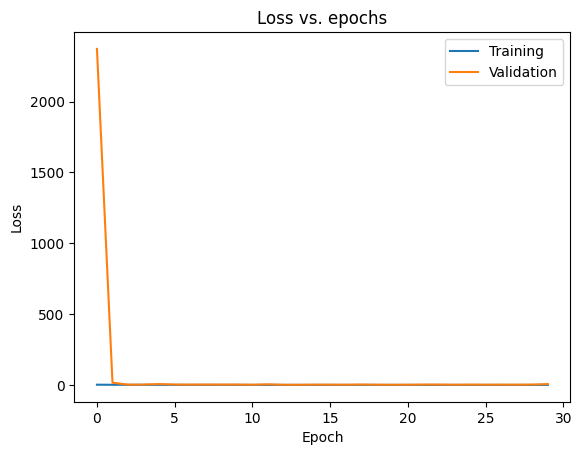

In [50]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Loss vs. epochs')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Training', 'Validation'], loc='upper right')
plt.show()


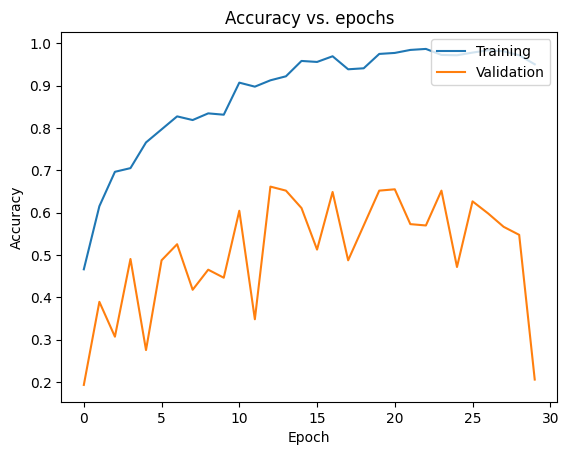

In [51]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Accuracy vs. epochs')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Training', 'Validation'], loc='upper right')
plt.show()


In [52]:
results = model.evaluate(test_ds, verbose=2) #değerlendirme yapar test veri kümesi üzerinden

13/13 - 208s - loss: 5.2830 - accuracy: 0.2871 - 208s/epoch - 16s/step


In [53]:
results

[5.283012866973877, 0.28710463643074036]

In [54]:
from tensorflow.keras.preprocessing import image
test_image = image.load_img('/content/drive/MyDrive/tree_dataset/test/oak/(369).png', target_size = (255, 255))
test_image = image.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis = 0)

In [55]:
labels=['oak', 'palm', 'pine', 'spruce', 'willow']


In [56]:
result = model.predict(test_image)


1/1 [==============================] - 2s 2s/step


In [57]:
result


array([[1.0073163e-02, 1.6663786e-03, 9.8825991e-01, 4.3015561e-07,
        1.3259186e-07]], dtype=float32)

In [59]:
result = model.predict(test_image) #tahmin ediyor

if max(result[0]) == result[0][0]:
  print(labels[0])


elif max(result[0]) == result[0][1]:
  print(labels[1])

elif max(result[0]) == result[0][2]:
  print(labels[2])

elif max(result[0]) == result[0][3]:
  print(labels[3])

else:
  print(labels[4])


1/1 [==============================] - 0s 26ms/step
pine


In [60]:
test_image = image.load_img('/content/drive/MyDrive/tree_dataset/test/pine/(313).png', target_size = (255, 255))
test_image = image.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis = 0)
result = model.predict(test_image)
if max(result[0]) == result[0][0]:
  print(labels[0])


elif max(result[0]) == result[0][1]:
  print(labels[1])

elif max(result[0]) == result[0][2]:
  print(labels[2])

elif max(result[0]) == result[0][3]:
  print(labels[3])

else:
  print(labels[4])


1/1 [==============================] - 0s 26ms/step
pine


In [66]:
from tensorflow.keras.preprocessing import image
test_image = image.load_img('/content/drive/MyDrive/tree_dataset/test/spruce/(329).png', target_size = (255, 255))
test_image = image.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis = 0)
result = model.predict(test_image)
if max(result[0]) == result[0][0]:
  print(labels[0])


elif max(result[0]) == result[0][1]:
  print(labels[1])

elif max(result[0]) == result[0][2]:
  print(labels[2])

elif max(result[0]) == result[0][3]:
  print(labels[3])

else:
  print(labels[4])

1/1 [==============================] - 0s 25ms/step
pine


In [65]:
from tensorflow.keras.preprocessing import image
test_image = image.load_img('/content/drive/MyDrive/tree_dataset/test/palm/(360).png', target_size = (255, 255))
test_image = image.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis = 0)
result = model.predict(test_image)
if max(result[0]) == result[0][0]:
  print(labels[0])


elif max(result[0]) == result[0][1]:
  print(labels[1])

elif max(result[0]) == result[0][2]:
  print(labels[2])

elif max(result[0]) == result[0][3]:
  print(labels[3])

else:
  print(labels[4])

1/1 [==============================] - 0s 27ms/step
pine
